In [1]:
# Installation bibliothèque
%pip install spacy

  Using cached numpy-2.2.6-cp312-cp312-win_amd64.whl.metadata (60 kB)
Using cached numpy-2.2.6-cp312-cp312-win_amd64.whl (12.6 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
Note: you may need to restart the kernel to use updated packages.


  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
contourpy 1.2.0 requires numpy<2.0,>=1.20, but you have numpy 2.2.6 which is incompatible.
gensim 4.3.3 requires numpy<2.0,>=1.18.5, but you have numpy 2.2.6 which is incompatible.
numba 0.60.0 requires numpy<2.1,>=1.22, but you have numpy 2.2.6 which is incompatible.


In [2]:
!python -m spacy download fr_core_news_sm

     ---------------------------------------- 0.0/16.3 MB ? eta -:--:--
     -------------- ------------------------- 6.0/16.3 MB 30.8 MB/s eta 0:00:01
     --------------------------------------- 16.3/16.3 MB 46.7 MB/s eta 0:00:00
[+] Download and installation successful
You can now load the package via spacy.load('fr_core_news_sm')


In [3]:
import spacy
import pandas as pd

# Chargement du modèle français de spaCy
nlp = spacy.load("fr_core_news_sm")



# Fonction qui va :
# 1. Tokeniser,
# 2. Retirer les stopwords,
# 3. Lemmiser

def traitement(texte):

    liste = nlp(texte)         # Tokenisation avec nlp
    tokens = [
        token.lemma_           # Lemmisation
        for token in liste
        if not token.is_stop and not token.is_punct and not token.is_space    # Retrait des stopwords, ponctuations et espaces
    ]
    return " ".join(tokens)



In [17]:
# Récupération des données précédemment travaillées

df = pd.read_csv("fichier_traduit.csv")
df_clean = df.drop(columns=['merged', 'nb_caracteres', 'langue', 'merged_tronq', 'merged_corr'])   # On retire les colonnes qui ne nous serons plus utiles
df_clean.head()

,productid,imageid,prdtypecode,merged_tronq_trad
0,3804725264,1263597046,10,olivia : carnet de notes personnalisé / 150 pa...
1,436067568,1008141237,2280,journal des arts (le) ndeg 133 du 28/09/2001 -...
2,201115110,938777978,50,grand stylet ergonomique bleu gamepad nintendo...
3,50418756,457047496,1280,peluche donald - europe - disneyland 2000 (mar...
4,278535884,1077757786,2705,la guerre des tuques - luc a des idées de gran...


In [19]:
# Application de la fonction

df_clean['merged'] = df_clean['merged_tronq_trad'].fillna("").apply(traitement)

In [22]:
df_clean = df_clean.drop(columns=["merged_tronq_trad"])
df_clean.head()

,productid,imageid,prdtypecode,merged
0,3804725264,1263597046,10,olivia carnet note personnaliser 150 page gril...
1,436067568,1008141237,2280,journal art ndeg 133 28/09/2001 art marche sal...
2,201115110,938777978,50,grand stylet ergonomique bleu gamepad nintendo...
3,50418756,457047496,1280,peluche donald europe disneyland 2000 marionne...
4,278535884,1077757786,2705,guerre tuque luc idée grandeur vouloir organis...


In [23]:
# ILLUSTRATION AVEC DES WORD CLOUDS

# Correspondance des catégories 

# 1. Dictionnaire
categories = {
    10: "Livres occasion",
    2280: "Journaux et revues occasions",
    2403: "Livres, BD et magazines",
    2522: "Fournitures papeterie et accessoires bureau",
    2705: "Livres neufs",
    40: "Jeux videos, CDs, équipements, câbles, neufs",
    50: "Accessoires gaming",
    60: "Consoles de jeux",
    2462: "Jeux vidéos occasion",
    2905: "Jeux vidéos pour PC",
    1140: "Figurines, objets pop culture",
    1160: "Cartes de jeux",
    1180: "Figurines et jeux de rôles",
    1280: "Jouets enfant",
    1281: "Jeux société enfants",
    1300: "Modélisme",
    1302: "Jeux de pleins air, Habits",
    1560: "Mobilier général",
    2582: "Mobilier de jardin",
    1320: "Puériculture, accessoire bébé",
    2220: "Animalerie",
    2583: "Piscine et accessoires",
    2585: "Outillages de jardin, équipements extérieur et piscine",
    1920: "Linge de maison",
    2060: "Décoration",
    1301: "Chaussettes bébés, petites photos",
    1940: "Confiserie"
}

# 2. Mapping
df_clean['category_name'] = df_clean['prdtypecode'].map(categories)

df_clean.head()


,productid,imageid,prdtypecode,merged,category_name
0,3804725264,1263597046,10,olivia carnet note personnaliser 150 page gril...,Livres occasion
1,436067568,1008141237,2280,journal art ndeg 133 28/09/2001 art marche sal...,Journaux et revues occasions
2,201115110,938777978,50,grand stylet ergonomique bleu gamepad nintendo...,Accessoires gaming
3,50418756,457047496,1280,peluche donald europe disneyland 2000 marionne...,Jouets enfant
4,278535884,1077757786,2705,guerre tuque luc idée grandeur vouloir organis...,Livres neufs


  You can safely remove it manually.
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


  Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp312-cp312-win_amd64.whl (15.5 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
Note: you may need to restart the kernel to use updated packages.


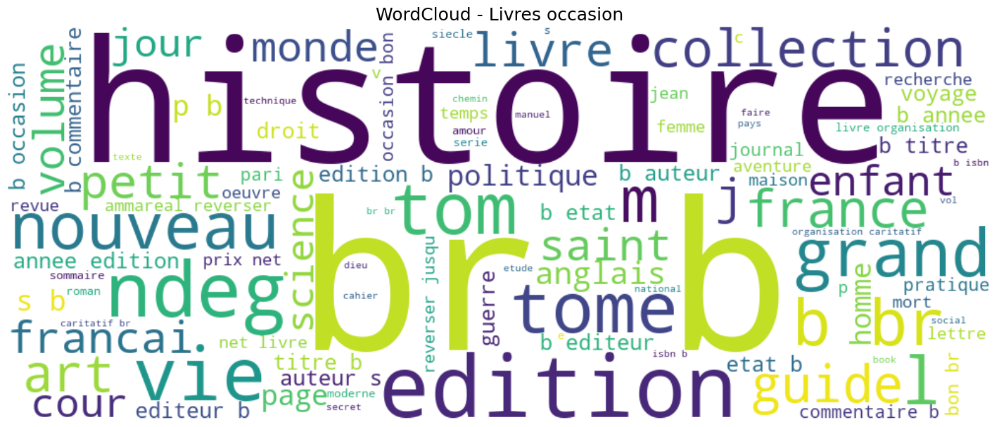

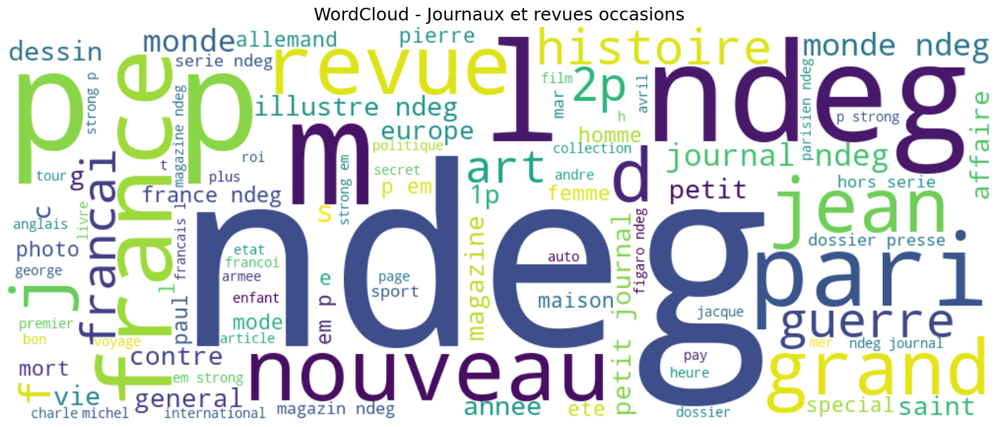

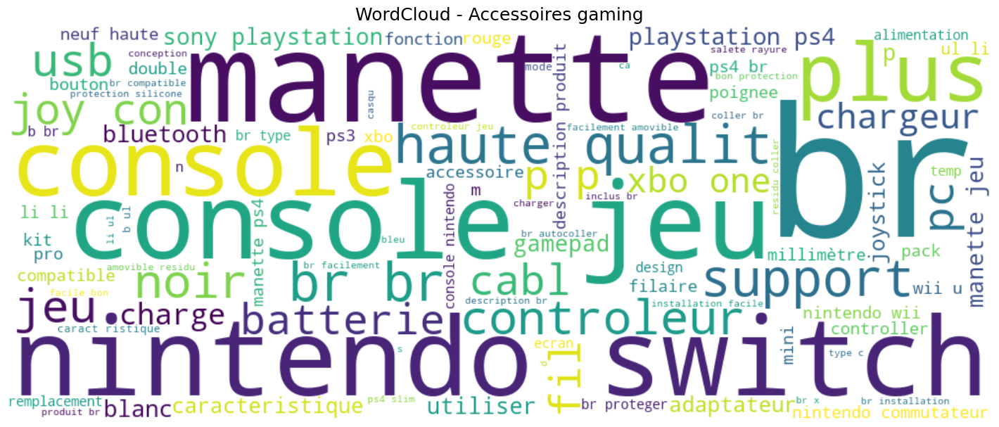

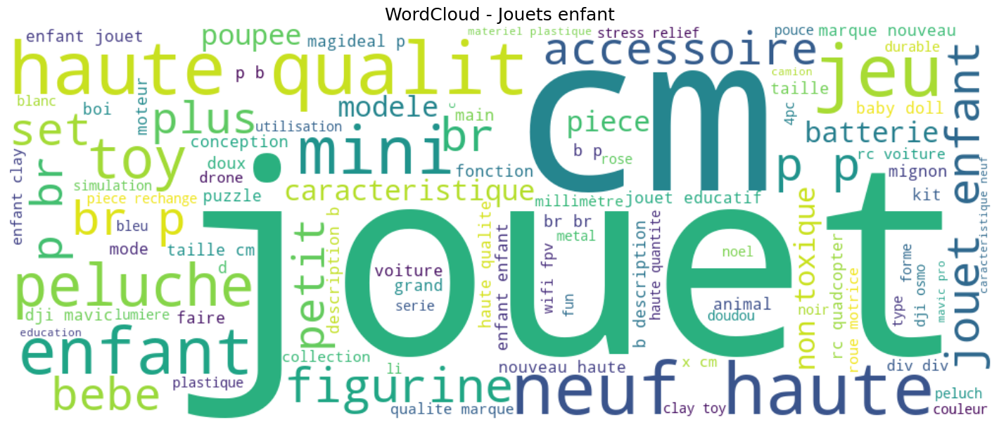

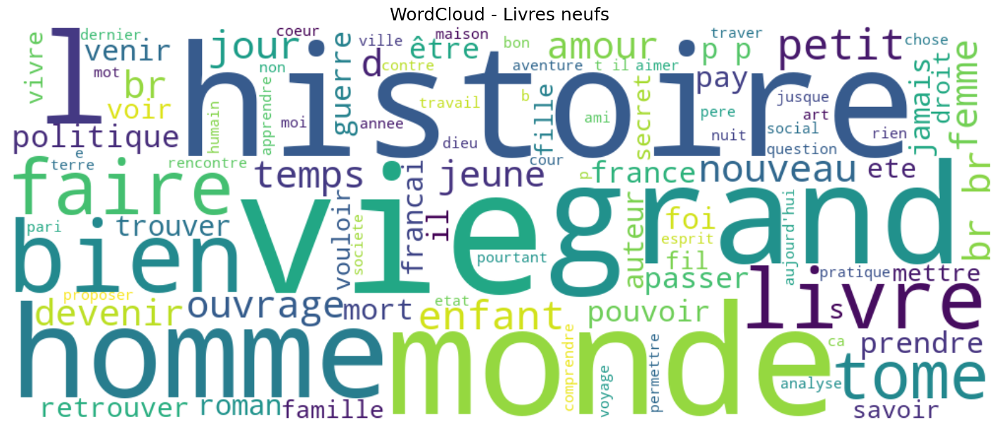

...

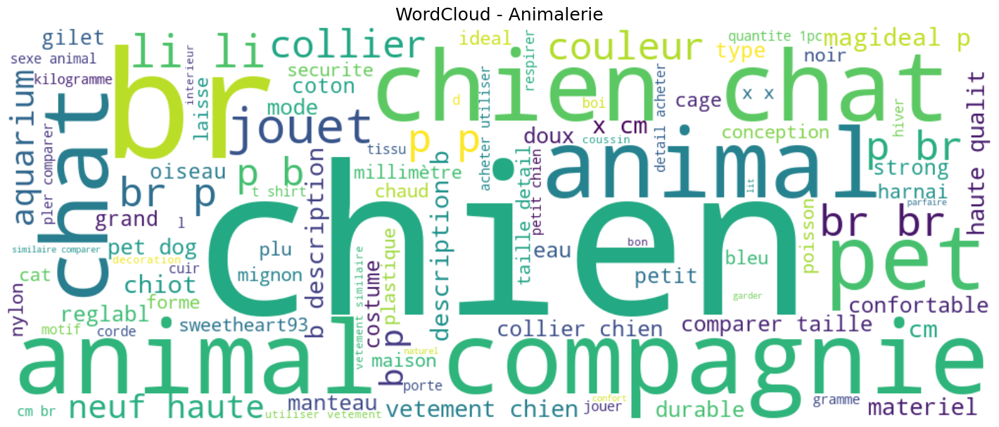

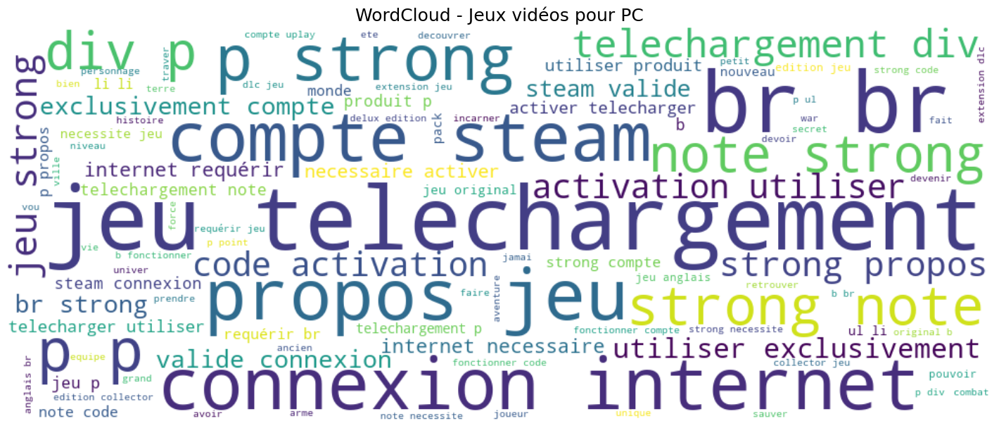

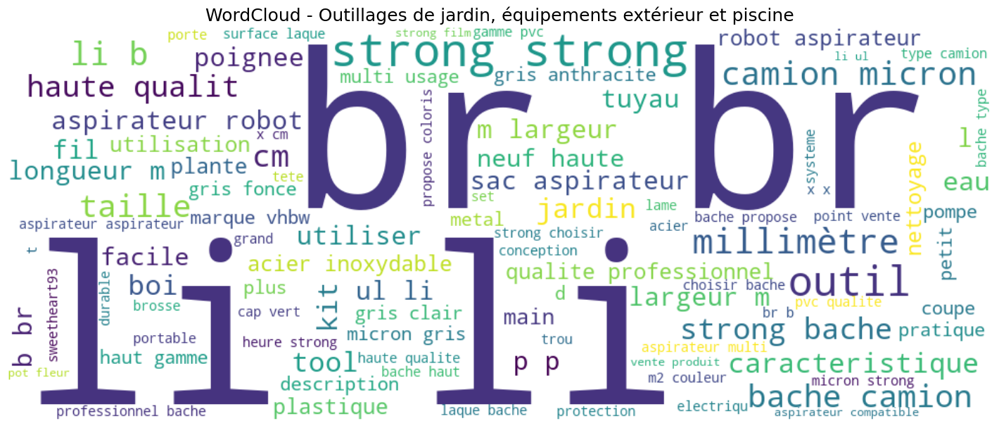

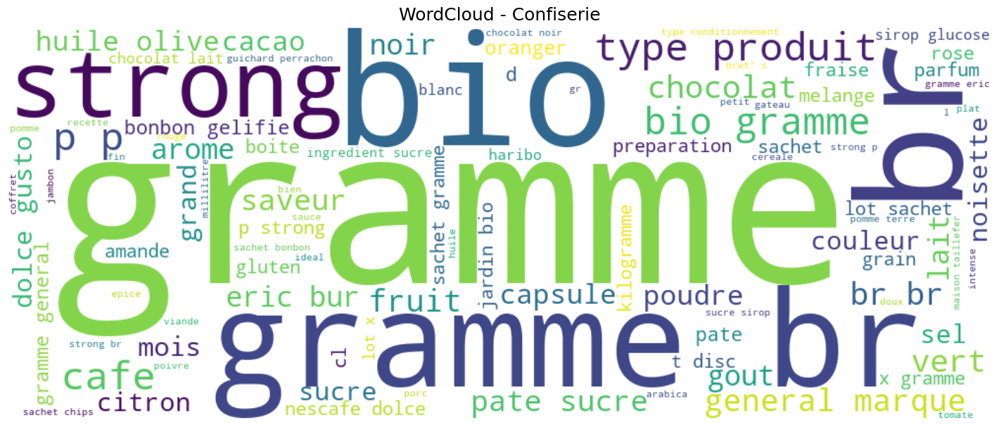

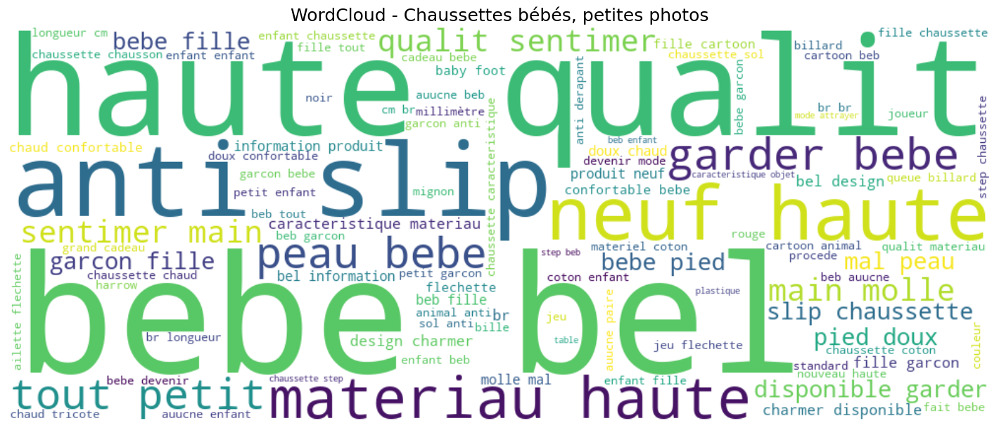

In [24]:
%pip install wordcloud matplotlib

from wordcloud import WordCloud
import matplotlib.pyplot as plt


categories_uniques = df_clean['category_name'].dropna().unique()

for cat in categories_uniques:

    textes_cat = " ".join(df_clean[df_clean['category_name'] == cat]['merged'].dropna())

    wordcloud = WordCloud(
        width=1000,
        height=400,
        background_color='white',
        max_words=100,
        colormap='viridis'
    ).generate(textes_cat)

    plt.figure(figsize=(14, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud - {cat}", fontsize=18)
    plt.tight_layout(pad=0)
    plt.show()

In [26]:
# Sauvegarde
df_clean.to_csv("df_fusionne_clean.csv", index=False)
df_clean.to_excel("df_fusionne_clean.xlsx", index=False)